In [65]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from wordcloud import WordCloud

In [66]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation, NMF

In [67]:
df = pd.read_csv('archivos/dataset_unificado.csv')
df.drop(columns=['Unnamed: 0'], inplace=True)

df

,Title,Document Type,Authors,Source title,Volume,Year,Page start,Page end,DOI,Link,ISSN,Source,Keywords,Abstract
0,Bentonite as eco-friendly natural mineral supp...,Article,Hatvani-Nagy A.F.; Hajdu V.; Ilosvai Á.M.; Mur...,Scientific Reports,14.0,2024,NaN,NaN,10.1038/s41598-024-54792-5,https://www.scopus.com/inward/record.uri?eid=2...,20452322,Scopus,"2,4-DNT; Ferrite; Hydrogenation; Magnetic; Sta...",Toluene diamine (TDA) is a major raw material ...
1,Humidity-tolerant porous polymer coating for p...,Article,Hong D.; Lee Y.J.; Jeon O.S.; Lee I.-S.; Lee S...,Nature Communications,15.0,2024,NaN,NaN,10.1038/s41467-024-48621-6,https://www.scopus.com/inward/record.uri?eid=2...,20411723,Scopus,NaN,Coating building envelopes with a passive dayt...
2,Estimating digital product trade through corpo...,Article,Stojkoski V.; Koch P.; Coll E.; Hidalgo C.A.,Nature Communications,15.0,2024,NaN,NaN,10.1038/s41467-024-49141-z,https://www.scopus.com/inward/record.uri?eid=2...,20411723,Scopus,NaN,Despite global efforts to harmonize internatio...
3,Optimizing scope 3 emissions in the automotive...,Article,Wang Y.; Hao Y.; Hou Y.; Quan Q.; Li Y.,Carbon Research,3.0,2024,NaN,NaN,10.1007/s44246-024-00131-2,https://www.scopus.com/inward/record.uri?eid=2...,27316696,Scopus,Automotive industry; Carbon footprint; Machine...,The acceleration of global climate change pose...
4,Integrated assessment modeling of a zero-emiss...,Article,Speizer S.; Fuhrman J.; Aldrete Lopez L.; Geor...,Nature Communications,15.0,2024,NaN,NaN,10.1038/s41467-024-48424-9,https://www.scopus.com/inward/record.uri?eid=2...,20411723,Scopus,NaN,Currently responsible for over one fifth of ca...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6295,"Life cycle carbon, energy, water, and landuse ...",Journal,Sharno; Marjia Afroz; Hiloidhari; Moonmoon,Bioresource Technology Reports,20.0,2022,101234,NaN,https://doi.org/10.1016/j.biteb.2022.101234,https://www.sciencedirect.com/science/article/...,2589-014X,Sciencedirect,Biojet fuel; 2nd Generation Biomass; Life Cycl...,Biojet fuel is a low carbon alternative to fos...
6296,Household carbon footprints inequality in Chin...,Journal,Wang; Keying; Cui; Yongyan; Zhang; Hongwu; Shi...,Energy Economics,115.0,2022,106334,NaN,https://doi.org/10.1016/j.eneco.2022.106334,https://www.sciencedirect.com/science/article/...,0140-9883,Sciencedirect,Household carbon footprints; Inequality; Lifes...,The significant achievements in economic growt...
6297,Hourly based methods to assess carbon footprin...,Journal,Álvarez Flórez; Laura; Péan; Thibault; Salom; ...,Energy and Buildings,294.0,2023,113213,NaN,https://doi.org/10.1016/j.enbuild.2023.113213,https://www.sciencedirect.com/science/article/...,0378-7788,Sciencedirect,Demand response mechanisms; Energy flexibility...,Constant emission factors to assess the carbon...
6298,Single-item substitutions can substantially re...,Journal,Rose; Donald; Willits-Smith; Amelia M; Heller;...,The American Journal of Clinical Nutrition,115.0,2022,378,387,https://doi.org/10.1093/ajcn/nqab338,https://www.sciencedirect.com/science/article/...,0002-9165,Sciencedirect,sustainable diets; carbon footprint; water use...,ABSTRACT Background Human food systems substan...


In [68]:
df.dtypes

Title             object
Document Type     object
Authors           object
Source title      object
Volume           float64
Year               int64
Page start        object
Page end          object
DOI               object
Link              object
ISSN              object
Source            object
Keywords          object
Abstract          object
dtype: object

## Pre-procesamiento 

In [69]:
df.dropna(inplace=True)
df.reset_index(inplace=True)
df.drop(columns=['index'], inplace=True)
df['ISSN'] = df['ISSN'].str.replace('-', '')

df.to_csv('archivos/dataset_trabajado.csv', sep=',')

df

,Title,Document Type,Authors,Source title,Volume,Year,Page start,Page end,DOI,Link,ISSN,Source,Keywords,Abstract
0,BIOREMEDIATION OF SULFATE IN WATER ENVIRONMENT...,Article,Yadav G.S.; Ghosh P.K.,Journal of Solid Waste Technology and Management,50.0,2024,430,440,10.5276/JSWTM/ISWMAW/501/2024.430,https://www.scopus.com/inward/record.uri?eid=2...,10881697,Scopus,Acid mine drainage; Biological treatment; Carb...,Sulfate-laden wastewater generated from variou...
1,Combining slow-release fertilizer and plastic ...,Article,Han X.; Dang P.; Liao L.; Song F.; Zhang M.; Z...,Journal of Environmental Sciences (China),147.0,2025,359,369,10.1016/j.jes.2023.12.001,https://www.scopus.com/inward/record.uri?eid=2...,10010742,Scopus,Carbon footprint; Economic benefits; Maize gra...,Agricultural practices significantly contribut...
2,Carbon emissions in China's steel industry fro...,Article,Song X.; Du S.; Deng C.; Shen P.; Xie M.; Zhao...,Journal of Environmental Sciences (China),148.0,2025,650,664,10.1016/j.jes.2023.04.027,https://www.scopus.com/inward/record.uri?eid=2...,10010742,Scopus,Carbon dioxide (CO<sub>2</sub>) emissions; Car...,China is the most important steel producer in ...
3,Bioenergy recovery and carbon emissions benefi...,Article,Wang H.; Fu X.; Huang H.; Shen D.; Fan D.; Zhu...,Journal of Environmental Sciences (China),148.0,2025,321,335,10.1016/j.jes.2023.08.022,https://www.scopus.com/inward/record.uri?eid=2...,10010742,Scopus,Anaerobic digestion; Bio-thermophilic pretreat...,"Sewage sludge in cities of Yangzi River Belt, ..."
4,Sustainability evaluation of C3MR natural gas ...,Article,Hareem M.; Raza F.; Kazmi B.; Ghauri R.; Zafar...,Journal of Industrial and Engineering Chemistry,137.0,2024,619,636,10.1016/j.jiec.2024.05.041,https://www.scopus.com/inward/record.uri?eid=2...,1226086X,Scopus,LCA; Liquefaction; Natural gas; Process analys...,"In a transition towards a clean energy future,..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1608,An analysis of energy consumption and carbon f...,Journal,Kohli; Varun; Chakravarty; Sombuddha; Chamola;...,Digital Communications and Networks,9.0,2023,79,89,https://doi.org/10.1016/j.dcan.2022.06.017,https://www.sciencedirect.com/science/article/...,23528648,Sciencedirect,Blockchain; Carbon footprint; Climate change; ...,There is an urgent need to control global warm...
1609,Downscaling consumption to universal basic inc...,Journal,Kalaniemi; Salla; Ottelin; Juudit; Heinonen; J...,Environmental Science & Policy,114.0,2020,377,383,https://doi.org/10.1016/j.envsci.2020.09.006,https://www.sciencedirect.com/science/article/...,14629011,Sciencedirect,Greenhouse gas emissions; Climate change; Carb...,Human economic activities and following carbon...
1610,Decomposing the carbon footprints of multinati...,Journal,Yan; Yunfeng; Li; Xiyuan; Wang; Ran; Zhao; Zho...,Structural Change and Economic Dynamics,66.0,2023,13,28,https://doi.org/10.1016/j.strueco.2023.03.011,https://www.sciencedirect.com/science/article/...,0954349X,Sciencedirect,Multinational enterprises; Carbon footprints; ...,Significant environmental impacts of multinati...
1611,Single-item substitutions can substantially re...,Journal,Rose; Donald; Willits-Smith; Amelia M; Heller;...,The American Journal of Clinical Nutrition,115.0,2022,378,387,https://doi.org/10.1093/ajcn/nqab338,https://www.sciencedirect.com/science/article/...,00029165,Sciencedirect,sustainable diets; carbon footprint; water use...,ABSTRACT Background Human food systems substan...


## Procesar Corpus

In [70]:
palabras_vacias = [linea.rstrip('\n') for linea in open('archivos/english.txt')]
palabras_vacias.extend(['the','The','I','If', 'negative', 'Negative', 'Nothing', 'nothing'])
len(palabras_vacias)

1306

In [71]:
corpus = list(df['Title'].str.lower())
len(corpus)

1613

In [72]:
import re 

def remove_sw(t): 
  tokens = t.strip().split(' ')
  tokens = [token for token in tokens if token not in palabras_vacias]
  tout = ' '.join(tokens).strip()
  return tout 
 

def clean_text(t): 
  t = str(t) 
  t = re.sub(r'\d+',' ',t)
  t = re.sub(r'[^\w\n]',' ',t)
  t = re.sub(r'\s\s+',' ',t)
  t = t.lower()
  t = t.strip()
  return t

In [73]:
corpus = [clean_text(t) for t in corpus]
corpus = [remove_sw(t) for t in corpus]
corpus

['bioremediation sulfate water environment overview removal pathways influencing factors',
 'combining slow release fertilizer plastic film mulching reduced carbon footprint enhanced maize yield loess plateau',
 'carbon emissions china steel industry life cycle perspective carbon footprint insights',
 'bioenergy recovery carbon emissions benefits short term bio thermophilic pretreatment organic sewage sludge anaerobic digestion pilot scale study',
 'sustainability evaluation natural gas liquefaction process integrating life cycle analysis energy exergy economic aspects',
 'dietary water carbon footprints china',
 'green technology innovation pricing decisions carbon footprint government subsidies',
 'transparency pays carbon emission disclosure lowers cost capital',
 'miscanthus biochar sustainable substrates horticulture economic carbon footprint assessment primary cascading chains',
 'facing solid waste cotton straw plastic mulch film mixture china centralized decentralized pyrolysis

## TF-IDF

In [74]:
tf_vectorizer = CountVectorizer(strip_accents = 'unicode', stop_words = 'english', lowercase = True)
dtm_tf = tf_vectorizer.fit_transform(corpus)
print(dtm_tf.shape)

(1613, 4438)


In [75]:
tfidf_vectorizer = TfidfVectorizer(**tf_vectorizer.get_params())
dtm_tfidf = tfidf_vectorizer.fit_transform(corpus)
print(dtm_tfidf.shape)

(1613, 4438)


c:\Users\keysw\miniconda3\envs\myenv\lib\site-packages\sklearn\feature_extraction\text.py:2065: UserWarning: Only (<class 'numpy.float64'>, <class 'numpy.float32'>, <class 'numpy.float16'>) 'dtype' should be used. <class 'numpy.int64'> 'dtype' will be converted to np.float64.
  warnings.warn(


In [76]:
vocabulario = tfidf_vectorizer.get_feature_names_out()

vocabulario

array(['aab', 'aardl', 'ab', ..., 'сознания', 'формам', 'четырем'],
      dtype=object)

In [77]:
n_top_pal = 10

def crear_nubes(col_cluster, nc=10):
  gc = 2
  gr = int(nc/gc)
  wcwidth  = 1600
  wcheight = 800
  fig = plt.figure(figsize = (25,60))
  fig.suptitle('Análisis con {}'.format(col_cluster), fontsize=24)

  for i in range(nc):
    dfs = df[df[col_cluster] == i]['text']
    labels =  df[df[col_cluster] == i][str(col_cluster) + ' Label']
    label = labels.iloc[0]
    texto = ' '.join(map(str,dfs.tolist()))
    wc = WordCloud(width=wcwidth, height=wcheight,colormap="Paired").generate(texto)
    ax = fig.add_subplot(gr,gc,i+1)
    ax.imshow(wc,interpolation='bilinear')
    ax.axis('off')
    ax.set_title('{} - {}'.format(col_cluster, str(label)))
    ax.title.set_size(20)
  return fig

In [78]:
tfidf_scores = dict(zip(tfidf_vectorizer.get_feature_names_out(), dtm_tfidf.sum(axis=0).tolist()[0]))

top_words = sorted(tfidf_scores.items(), key=lambda x: x[1], reverse=True)[:10]

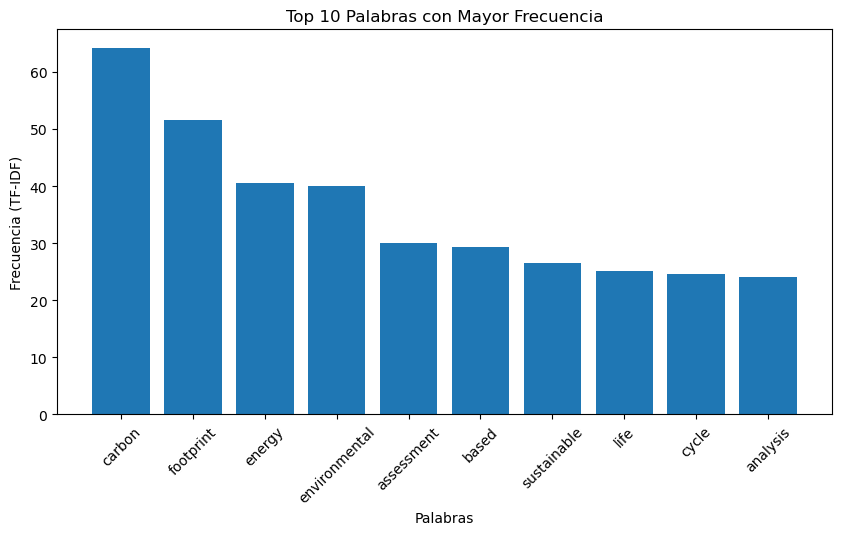

In [79]:
words, scores = zip(*top_words)


plt.figure(figsize=(10, 5))
plt.bar(words, scores)
plt.xlabel('Palabras')
plt.ylabel('Frecuencia (TF-IDF)')
plt.title('Top 10 Palabras con Mayor Frecuencia')
plt.xticks(rotation=45)
plt.show()

## LDA

In [80]:
lda_model = LatentDirichletAllocation(n_components=10, random_state=33, n_jobs=-1)
lda = lda_model.fit_transform(dtm_tfidf)

lda

array([[0.02528012, 0.02528219, 0.02528191, ..., 0.02528001, 0.02527808,
        0.02527905],
       [0.02109402, 0.02108578, 0.02108751, ..., 0.02109168, 0.02109516,
        0.02108822],
       [0.02445869, 0.02446599, 0.02446055, ..., 0.02447327, 0.0244611 ,
        0.02446567],
       ...,
       [0.02836249, 0.02836437, 0.02836326, ..., 0.02836275, 0.02836625,
        0.74472802],
       [0.02577946, 0.0257793 , 0.02578772, ..., 0.02578122, 0.02578633,
        0.02577863],
       [0.02855331, 0.02856544, 0.74297489, ..., 0.02855533, 0.02855687,
        0.02856251]])

In [81]:
tp_palabra = {}

for topico, comp in enumerate(lda_model.components_):
  pal_ind = np.argsort(comp)[::-1][:n_top_pal]
  tp_palabra[topico] = [vocabulario[i] for i in pal_ind]

In [82]:
for topico,palabras in tp_palabra.items():
  print("Tópico {} : {}".format(topico, ', '.join(palabras)))

Tópico 0 : carbon, footprint, cycle, emissions, life, energy, assessment, sustainable, ecological, environmental
Tópico 1 : carbon, environmental, footprint, evidence, emissions, sustainable, approach, chain, energy, development
Tópico 2 : carbon, footprint, sustainable, analysis, energy, green, study, environmental, based, assessment
Tópico 3 : carbon, concrete, properties, mechanical, footprint, ash, activated, alkali, study, based
Tópico 4 : energy, carbon, footprint, environmental, impact, china, based, renewable, performance, analysis
Tópico 5 : carbon, footprint, assessment, cycle, life, environmental, green, exploring, concrete, based
Tópico 6 : energy, carbon, footprint, environmental, water, assessment, impact, reduction, sustainable, study
Tópico 7 : environmental, carbon, economic, footprint, sustainability, green, assessment, based, growth, ecological
Tópico 8 : carbon, footprint, production, environmental, energy, based, assessment, systems, cycle, sustainable
Tópico 9 : c

In [83]:
tp_doc = []
for d in range(lda.shape[0]):
  tp_doc.append(lda[d].argmax())

df['text'] = corpus
df['LDA'] = tp_doc

lda_labels = {0 : 'Sostenibilidad Ecologica', 1 : 'Evaluación Ambiental', 
              2 : 'Estudio del Medio Ambiente', 3 : 'Estudio de Residuos por Maquinarias', 
              4 : 'Impacto de China con su Tecnologias Renovables', 5 : 'Evaluación de la Huella de Carbono', 
              6 : 'Reducción del Agua por la Generación de Energía', 7 : 'Relación de la Economía y la Sostenibilidad Ambiental', 
              8 : 'Sistemas de Producción de Energias Sostenibles', 9 : 'La Sostenibilidad y el Cambio Climatico'}

df['LDA Label'] = df['LDA'].map(lda_labels)

df

,Title,Document Type,Authors,Source title,Volume,Year,Page start,Page end,DOI,Link,ISSN,Source,Keywords,Abstract,text,LDA,LDA Label
0,BIOREMEDIATION OF SULFATE IN WATER ENVIRONMENT...,Article,Yadav G.S.; Ghosh P.K.,Journal of Solid Waste Technology and Management,50.0,2024,430,440,10.5276/JSWTM/ISWMAW/501/2024.430,https://www.scopus.com/inward/record.uri?eid=2...,10881697,Scopus,Acid mine drainage; Biological treatment; Carb...,Sulfate-laden wastewater generated from variou...,bioremediation sulfate water environment overv...,4,Impacto de China con su Tecnologias Renovables
1,Combining slow-release fertilizer and plastic ...,Article,Han X.; Dang P.; Liao L.; Song F.; Zhang M.; Z...,Journal of Environmental Sciences (China),147.0,2025,359,369,10.1016/j.jes.2023.12.001,https://www.scopus.com/inward/record.uri?eid=2...,10010742,Scopus,Carbon footprint; Economic benefits; Maize gra...,Agricultural practices significantly contribut...,combining slow release fertilizer plastic film...,3,Estudio de Residuos por Maquinarias
2,Carbon emissions in China's steel industry fro...,Article,Song X.; Du S.; Deng C.; Shen P.; Xie M.; Zhao...,Journal of Environmental Sciences (China),148.0,2025,650,664,10.1016/j.jes.2023.04.027,https://www.scopus.com/inward/record.uri?eid=2...,10010742,Scopus,Carbon dioxide (CO<sub>2</sub>) emissions; Car...,China is the most important steel producer in ...,carbon emissions china steel industry life cyc...,5,Evaluación de la Huella de Carbono
3,Bioenergy recovery and carbon emissions benefi...,Article,Wang H.; Fu X.; Huang H.; Shen D.; Fan D.; Zhu...,Journal of Environmental Sciences (China),148.0,2025,321,335,10.1016/j.jes.2023.08.022,https://www.scopus.com/inward/record.uri?eid=2...,10010742,Scopus,Anaerobic digestion; Bio-thermophilic pretreat...,"Sewage sludge in cities of Yangzi River Belt, ...",bioenergy recovery carbon emissions benefits s...,1,Evaluación Ambiental
4,Sustainability evaluation of C3MR natural gas ...,Article,Hareem M.; Raza F.; Kazmi B.; Ghauri R.; Zafar...,Journal of Industrial and Engineering Chemistry,137.0,2024,619,636,10.1016/j.jiec.2024.05.041,https://www.scopus.com/inward/record.uri?eid=2...,1226086X,Scopus,LCA; Liquefaction; Natural gas; Process analys...,"In a transition towards a clean energy future,...",sustainability evaluation natural gas liquefac...,3,Estudio de Residuos por Maquinarias
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1608,An analysis of energy consumption and carbon f...,Journal,Kohli; Varun; Chakravarty; Sombuddha; Chamola;...,Digital Communications and Networks,9.0,2023,79,89,https://doi.org/10.1016/j.dcan.2022.06.017,https://www.sciencedirect.com/science/article/...,23528648,Sciencedirect,Blockchain; Carbon footprint; Climate change; ...,There is an urgent need to control global warm...,analysis energy consumption carbon footprints ...,6,Reducción del Agua por la Generación de Energía
1609,Downscaling consumption to universal basic inc...,Journal,Kalaniemi; Salla; Ottelin; Juudit; Heinonen; J...,Environmental Science & Policy,114.0,2020,377,383,https://doi.org/10.1016/j.envsci.2020.09.006,https://www.sciencedirect.com/science/article/...,14629011,Sciencedirect,Greenhouse gas emissions; Climate change; Carb...,Human economic activities and following carbon...,downscaling consumption universal basic income...,1,Evaluación Ambiental
1610,Decomposing the carbon footprints of multinati...,Journal,Yan; Yunfeng; Li; Xiyuan; Wang; Ran; Zhao; Zho...,Structural Change and Economic Dynamics,66.0,2023,13,28,https://doi.org/10.1016/j.strueco.2023.03.011,https://www.sciencedirect.com/science/article/...,0954349X,Sciencedirect,Multinational enterprises; Carbon footprints; ...,Significant environmental impacts of multinati...,decomposing carbon footprints multinational en...,9,La Sostenibilidad y el Cambio Climatico
1611,Single-item substitutions can substantially re...,Journal,Rose; Donald; Willits-Smith; Amelia M; Heller;...,The American Journal 

## Análisis Exploratorio Univariado

In [84]:
from collections import Counter

def contar_palabras(texto: str):
    palabras = texto.split(sep=' ')
    return Counter(palabras)

df_freq = df.groupby('LDA Label')['text'].apply(lambda x: contar_palabras(' '.join(x))).reset_index()
df_freq.rename(columns={'text': 'Words Counter', 'level_1' : 'Text'}, inplace=True)

df_freq

,LDA Label,Text,Words Counter
0,Estudio de Residuos por Maquinarias,combining,1.0
1,Estudio de Residuos por Maquinarias,slow,1.0
2,Estudio de Residuos por Maquinarias,release,2.0
3,Estudio de Residuos por Maquinarias,fertilizer,1.0
4,Estudio de Residuos por Maquinarias,plastic,3.0
...,...,...,...
44495,Sostenibilidad Ecologica,unemployment,1.0
44496,Sostenibilidad Ecologica,nurses,1.0
44497,Sostenibilidad Ecologica,transformational,1.0
44498,Sostenibilidad Ecologica,rebound,1.0


Text(0, 0.5, 'Topico')

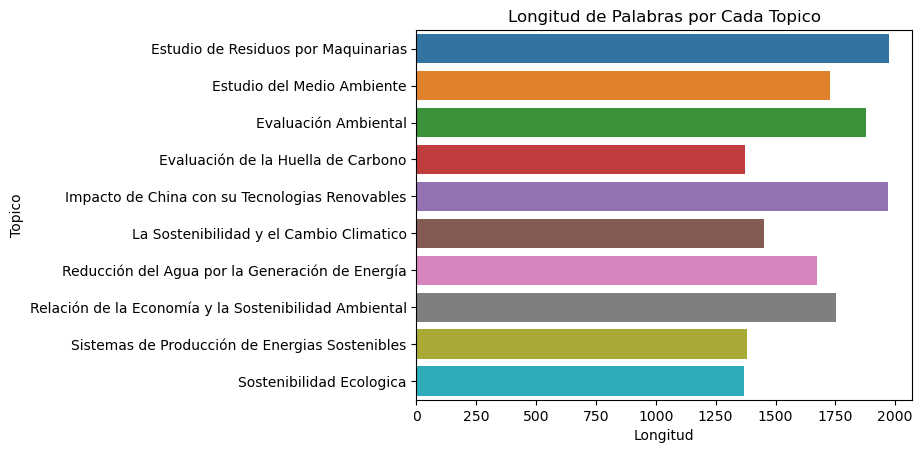

In [85]:
df_words = df_freq.groupby('LDA Label')['Words Counter'].sum().reset_index().dropna()

bar_freq = sns.barplot(df_words, y='LDA Label', x='Words Counter')
bar_freq.set_title('Longitud de Palabras por Cada Topico')
bar_freq.set_xlabel('Longitud')
bar_freq.set_ylabel('Topico')

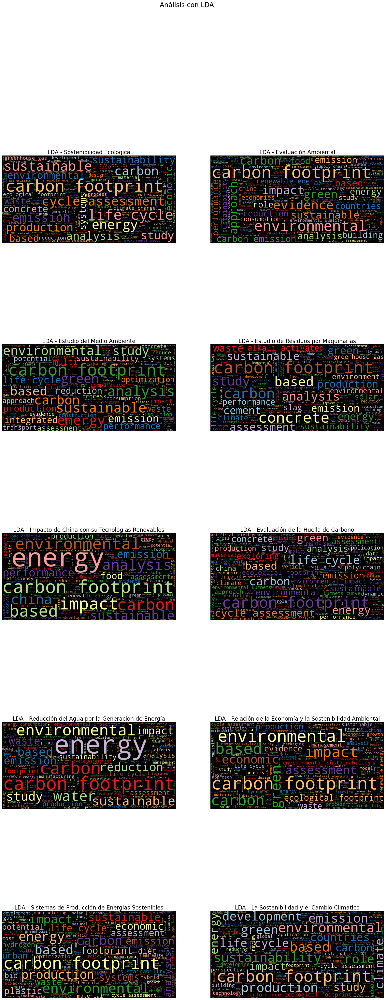

In [86]:
fig = crear_nubes('LDA')
plt.show()

Según las palabras en los topicos se puede apreciar que existen muchas palabras que se repiten cada topico, como pueden ser las emisiones (CO2), el medio ambiente, y sostenibilidad, lo que nos indica el grave problema en la actualidad sobre las emisiones de CO2 en el medio ambiente y el como estos generan problemas de sostenibilidad en diferentes ecosistemas, siendo que algunas palabras, muestran que estos se deben principalmente a la producción de diferentes materiales y a la producción de energía electrica.

## Análisis Exploratorio Bivariado

In [87]:
dfpv =  pd.pivot_table(df_freq.reset_index(),  index=['Text'], columns=['LDA Label'], values='Words Counter').dropna()

dfpv

LDA Label,Estudio de Residuos por Maquinarias,Estudio del Medio Ambiente,Evaluación Ambiental,Evaluación de la Huella de Carbono,Impacto de China con su Tecnologias Renovables,La Sostenibilidad y el Cambio Climatico,Reducción del Agua por la Generación de Energía,Relación de la Economía y la Sostenibilidad Ambiental,Sistemas de Producción de Energias Sostenibles,Sostenibilidad Ecologica
Text,,,,,,,,,,
analysis,17.0,20.0,11.0,15.0,20.0,4.0,10.0,10.0,9.0,10.0
application,1.0,4.0,3.0,2.0,2.0,5.0,1.0,3.0,2.0,1.0
assessment,13.0,13.0,10.0,25.0,11.0,15.0,18.0,21.0,13.0,15.0
based,20.0,15.0,11.0,17.0,25.0,15.0,14.0,23.0,17.0,9.0
carbon,58.0,49.0,71.0,57.0,55.0,32.0,55.0,50.0,45.0,34.0
chain,2.0,2.0,10.0,4.0,1.0,4.0,2.0,1.0,1.0,1.0
challenges,1.0,4.0,4.0,2.0,2.0,2.0,1.0,3.0,1.0,3.0
change,2.0,2.0,1.0,5.0,6.0,9.0,3.0,1.0,4.0,6.0
china,6.0,4.0,8.0,7.0,18.0,2.0,5.0,9.0,2.0,2.0


In [88]:
dfcorr = dfpv.corr(method='pearson', numeric_only=True).round(1)

dfcorr

LDA Label,Estudio de Residuos por Maquinarias,Estudio del Medio Ambiente,Evaluación Ambiental,Evaluación de la Huella de Carbono,Impacto de China con su Tecnologias Renovables,La Sostenibilidad y el Cambio Climatico,Reducción del Agua por la Generación de Energía,Relación de la Economía y la Sostenibilidad Ambiental,Sistemas de Producción de Energias Sostenibles,Sostenibilidad Ecologica
LDA Label,,,,,,,,,,
Estudio de Residuos por Maquinarias,1.0,0.9,0.8,0.9,0.8,0.7,0.8,0.7,0.8,0.8
Estudio del Medio Ambiente,0.9,1.0,0.9,0.9,0.9,0.8,0.8,0.8,0.9,0.9
Evaluación Ambiental,0.8,0.9,1.0,0.8,0.9,0.8,0.9,0.8,0.9,0.8
Evaluación de la Huella de Carbono,0.9,0.9,0.8,1.0,0.8,0.8,0.8,0.8,0.9,0.9
Impacto de China con su Tecnologias Renovables,0.8,0.9,0.9,0.8,1.0,0.7,0.9,0.8,0.8,0.8
La Sostenibilidad y el Cambio Climatico,0.7,0.8,0.8,0.8,0.7,1.0,0.7,0.8,0.8,0.8
Reducción del Agua por la Generación de Energía,0.8,0.8,0.9,0.8,0.9,0.7,1.0,0.8,0.9,0.9
Relación de la Economía y la Sostenibilidad Ambiental,0.7,0.8,0.8,0.8,0.8,0.8,0.8,1.0,0.9,0.8
Sistemas de Producción de Energias Sostenibles,0.8,0.9,0.9,0.9,0.8,0.8,0.9,0.9,1.0,0.9


Text(0.5, 1.0, 'Mapa de Calor')

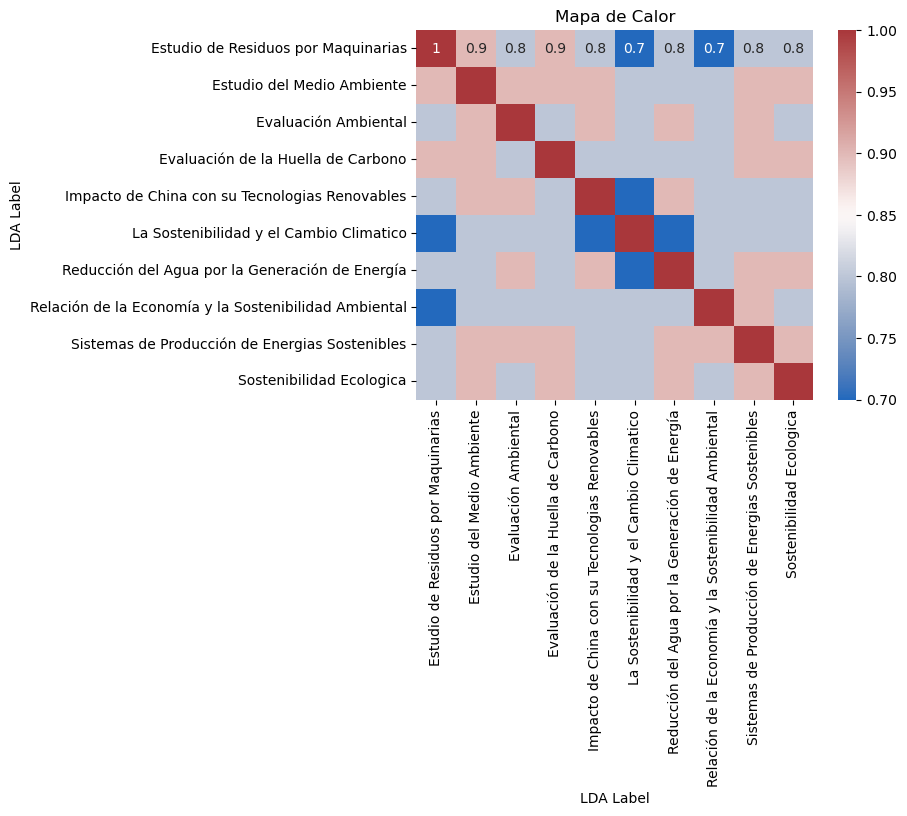

In [89]:
hm = sns.heatmap(data=dfcorr, cmap='vlag', annot=True)
hm.set_title("Mapa de Calor", loc='center')

Se puede apreciar que existen muchos estudios sobre el medio ambiente que se relacionan con las tecnologías sostenibles como la implementación o estudio de energias renovables, al igual que el impacto en el medio ambiente por el uso de energías que requieren de recursos naturales para su producción.

## NMF

In [90]:
nmf_model = NMF(n_components=10, random_state=33, max_iter=400)
nmf = nmf_model.fit_transform(dtm_tfidf)

In [91]:
tp_palabras_nmf = {}
for topico, comp in enumerate(nmf_model.components_):
  pal_ind = np.argsort(comp)[::-1][:n_top_pal]
  tp_palabras_nmf[topico] = [vocabulario[i] for i in pal_ind]

In [92]:
for topico,palabras in tp_palabras_nmf.items():
  print("Tópico {} : {}".format(topico,' ,'.join(palabras)))

Tópico 0 : carbon ,footprint ,reduction ,china ,analysis ,impact ,review ,footprints ,food ,emission
Tópico 1 : life ,cycle ,assessment ,comparative ,study ,packaging ,impacts ,evaluation ,building ,reusable
Tópico 2 : environmental ,sustainability ,impact ,economic ,evidence ,quality ,policy ,economies ,degradation ,impacts
Tópico 3 : based ,analysis ,optimization ,data ,model ,supply ,multi ,chain ,bio ,power
Tópico 4 : energy ,renewable ,ecological ,countries ,economic ,evidence ,consumption ,growth ,globalization ,role
Tópico 5 : climate ,change ,health ,footprints ,action ,role ,implications ,mitigation ,adaptation ,sector
Tópico 6 : concrete ,properties ,study ,mechanical ,ash ,performance ,cement ,geopolymer ,experimental ,fly
Tópico 7 : emissions ,gas ,greenhouse ,study ,reduction ,reducing ,chain ,systems ,china ,farm
Tópico 8 : sustainable ,green ,development ,construction ,practices ,role ,technologies ,goals ,challenges ,finance
Tópico 9 : production ,hydrogen ,water ,india

In [93]:
topicos_nmf = []
for n in range(nmf.shape[0]):
  topicos_nmf.append(nmf[n].argmax())

df['NMF'] = topicos_nmf

In [94]:
nmf_labels = {0 : 'Reducción de la Huella de Carbono en China', 1 : 'Ciclo de Vida de las Infraestructuras y sus Residuos', 
              2 : 'Politicas y Economía en Relación a la Sostenibilidad', 3 : 'Optimización para el Analisis de Datos', 
              4 : 'Energía Renovable por Países', 5 : 'El Rol del Cambio Climatico en la Salud', 
              6 : 'Estudio Residuos por Mecanismos de Construcción', 7 : 'Reducción de Emisiones en las Granjas Chinas', 
              8 : 'Sostenibilidad en las Infraestructuras Mediante Tecnologías Verdes', 
              9 : 'La Indía y sus Residuos Quimicos'}

df['NMF Label'] = df['NMF'].map(nmf_labels)

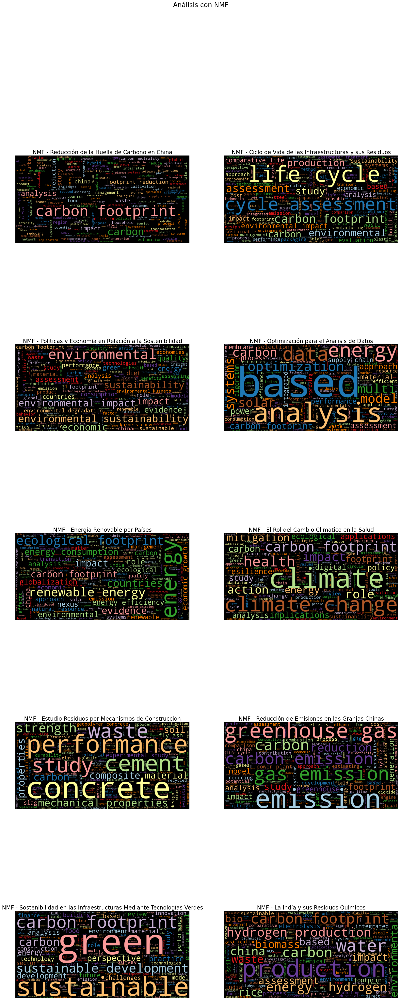

In [95]:
fig = crear_nubes('NMF')
plt.show()